# EOG Regression

## Methods
### Setting
Suppose we have $D$ sensors discretely sampling activity of a system over time. These sensors will sample the activity of the system, along with noise. Suppose further that we have $d$ sensors, each placed near a region of noise. In our setting, the $D$ sensors are scalp electrodes and the $d$ sensors are facial, back, neck, and EOG electrode channels.

We take the samples over time of these $D + d$ sensors and assume that our obervations are the sum of some unknown signal and a function of the activity at each of the $d$ noise regions. E.g.,
$$
Y = S + BN
$$
Where $N \in \mathbb{R}^{d \times T}$ is the noise matrix, $Y, S \in \mathbb{R}^{D \times T}$ are the observation and latent signal matrices respectively, and $B \in \mathbb{R}^{D \times d}$ is a signal mixing matrix (mixing the EOG channels to get a component in the EEG channels).

We would like to find an estimator $\hat{B}$ of the mixing matrix $B$.
E.g., given the loss function for $\hat{B}$ as
$$\mathcal{L}(\hat{B}) = \vert \vert S - (Y - \hat{B}N)\vert \vert $$
We would like the estimator to be the value which minimizes this loss, e.g.
$$
\hat{B} = \text{arg}\min_{B} \mathcal{L}(B)
$$
This way, we can take the matrix product $BN$ to recover the portion of the observation matrix $Y$ which is due to the $d$ noise sources (e.g. we can recover the signal by taking $S = Y - BN$).

We can solve for the best matrix $\hat{B}$ if we assume that the signals from the $d$ noise sensors and the true $D$ dimensional signal (the observations $Y$ minus any noise) are independent. This would give us that their covariance matrix is zero, e.g. that
$$
(S)N^T = 0 = (Y - BN)N^T = YN^T - BNN^T
$$
this would then imply that
$$
B = cov(Y, N) (cov(N, N))^{-1}
$$

This gives us an estimator for $\hat{B} = C_{YN}C_{NN}^{-1}$ where $C_{YN}$ is the covariance between the observations and the noise channels and $C_NN$ is the autocovariance of the noise channels.

This calculation requires space linear in the input size and time $O(TDd)$.

### Approach

This regression technique is used to find a matrix which relates measured noise channels to measured observation channels. Under the assumption that the noise channels and observation channels are independent, we can do simple matrix calculations to solve for the latent signal of the system.

Let $D$ be the number of observation channels, let $d$ be the number of noise channels, let $T$ be the number of observed timesteps.

Input: $Y \in \mathbb{R^{D \times T}}, N \in \mathbb{d \times T}$ the observation and noise matrices.

Output: $S \in \mathbb{R^{D \times T}}$ the signal matrix (denoised matrix)


$EOG\_REGRESSION(Y, N):$
1. $C_{YN} = YN^T$
2. $C_{NN} = NN^T$
3. $B = C_{YN}(C_{NN})^{-1}$
4. $S = Y - BN$
5. **return** S

For simulated data, we can measure effectiveness by taking the norm of the true signal matrix and the recovered signal matrix. For real data, we do not have any ground truth for the signal of the EEG system. We can only really make visual observations of the noise reduction of the system. A helpful addition to this data set would annotations of the EOG and EEG signals for when artifacts occur by a human expert, so that we could indeed have a quantitative measurement for performance in this task.

#### Real Code for testing

In [1]:
import pywt
import numpy as np
import matplotlib.pyplot as plt
import cPickle as pkl
import pandas as pd
import cufflinks as cf
import seaborn as sns
import sys
sys.path
sys.path.append('../..')
import methods
from methods.denoise import eog_split, eog_regress 
from methods.viz import sparklines, chan_errs

def good_data(D, d):
    X = np.linspace(0, 10, 5000)
    params = [(np.random.uniform() * 2 * np.pi, np.random.uniform() * 5) for i in range(D)]
    S = np.vstack([p[1] * np.sin(p[0] * X) for p in params])
    params = [(np.random.uniform() * 2 * np.pi, np.random.uniform() * 5) for i in range(d)]
    N = np.vstack([p[1] * np.sin(p[0] * X) for p in params])
    B = np.random.normal(size=[D, d])
    return S + B.dot(N), S, N
def bad_data(D, d):
    B = np.random.normal(size=[D, d])
    B_2 = np.random.normal(size=[D, d])
    X = np.linspace(0, 10, 5000)
    params = [(np.random.uniform() * 2 * np.pi, np.random.uniform() * 2.5) for i in range(D)]
    S = np.vstack([p[1] * np.sin(p[0] * X) for p in params])
    params = [(np.random.uniform() * 2 * np.pi, np.random.uniform() * 2.5) for i in range(d)]
    N = np.vstack([p[1] * np.sin(p[0] * X) for p in params])
    S = S + B_2.dot(N)
    return S + B.dot(2 * N), S, N

#### Good simulation -- independent signal and noise

In [2]:
Y, S, N = good_data(111, 17)
S_hat = eog_regress((Y, N), {}, {})
sparklines(S, Y, S_hat, '')
plt.show()

AttributeError: 'tuple' object has no attribute 'shape'

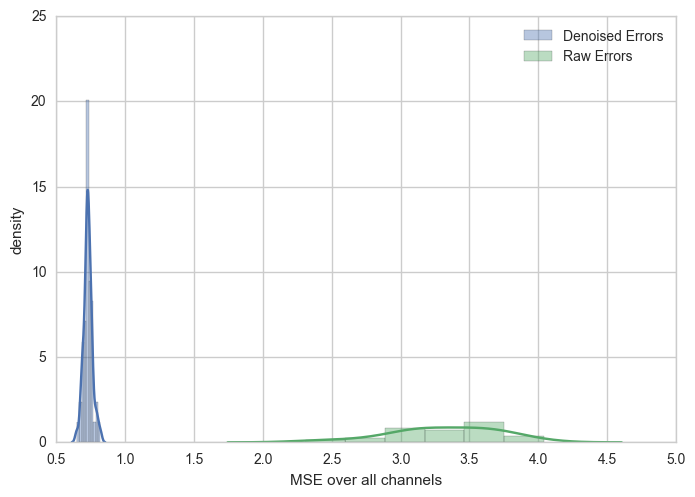

In [3]:
den_errs = []
raw_errs = []
for i in range(50):
    D = 111
    d = 17
    Y, S, N = good_data(D, d)
    S_hat = eog_regress((Y, N), {}, {})
    den_errs.append(np.linalg.norm(S_hat - S) / (D * d))
    raw_errs.append(np.linalg.norm(Y - S) / (D * d))
import seaborn as sns
sns.distplot(den_errs, label='Denoised Errors')
sns.distplot(raw_errs, label='Raw Errors')
plt.xlabel('MSE over all channels')
plt.ylabel('density')
plt.legend()
plt.show()

#### Bad simulation -- dependent signal and noise

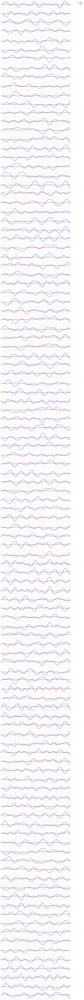

In [4]:
Y, S, N = bad_data(111, 17)
S_hat = eog_regress((Y, N), {}, {})
sparklines(S, Y, S_hat, '')
plt.show()

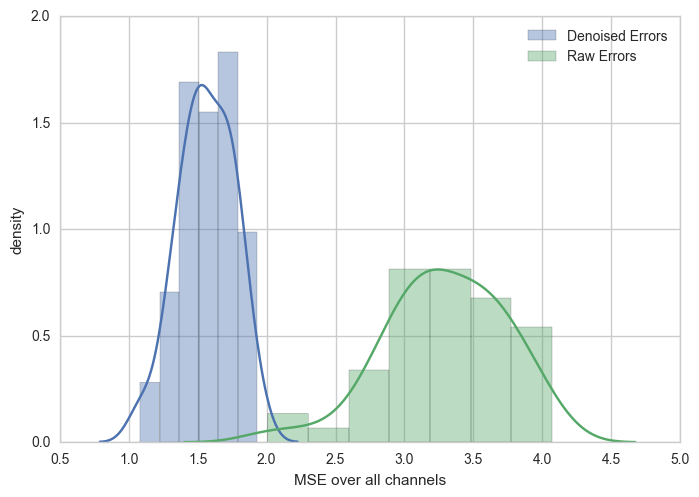

In [5]:
den_errs = []
raw_errs = []
for i in range(50):
    D = 111
    d = 17
    Y, S, N = bad_data(D, d)
    S_hat = eog_regress((Y, N), {}, {})
    den_errs.append(np.linalg.norm(S_hat - S) / (D * d))
    raw_errs.append(np.linalg.norm(Y - S) / (D * d))
import seaborn as sns
sns.distplot(den_errs, label='Denoised Errors')
sns.distplot(raw_errs, label='Raw Errors')
plt.xlabel('MSE over all channels')
plt.ylabel('density')
plt.legend()
plt.show()

#### Real Data

In [6]:
with open('../../../data/sub-0001_trial-01.pkl', 'rb') as f_handle:
    f_real = pkl.load(f_handle)
    f_real = f_real - np.mean(f_real, axis = 1).reshape(-1, 1)
with open('../../../data/sub-0001_trial-01_pre.pkl', 'rb') as f_handle:
    f_pre = pkl.load(f_handle)
    f_pre = f_pre - np.mean(f_pre, axis = 1).reshape(-1, 1)
with open('../../../data/sub-0001_trial-01_bc.pkl', 'rb') as f_handle:
    bc = pkl.load(f_handle)
print f_pre.shape, f_real.shape
print 'bad channels which were interpolated:', bc
Y, N = eog_split(f_real, {}, {})
S_hat = eog_regress((Y, N), {}, {})

(111, 177829) (128, 177829)
bad channels which were interpolated: [[   9.   36.   42.   51.   56.   57.   62.   70.   72.  101.  111.   46.
    49.   50.   56.   57.   58.   62.   66.   85.   94.  104.  106.]]


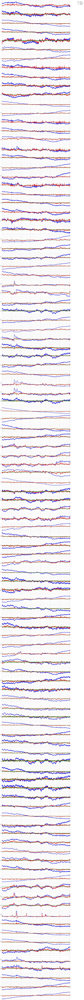

In [7]:
sparklines(f_pre[:, ::50], Y[:, ::50], S_hat[:, ::50], '')
plt.show()

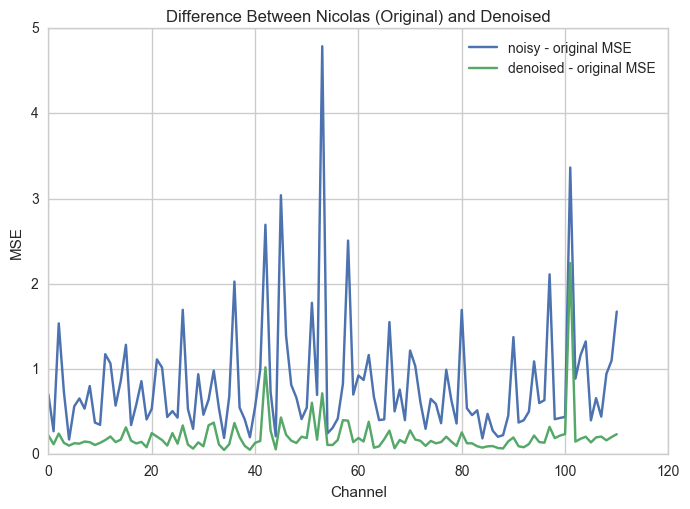

In [8]:
chan_errs(f_pre, Y, S_hat, 'Difference Between Nicolas (Original) and Denoised')